Muhammad Hassaan Azam

AI/ML Trainee

# **Cancer Detection Using Histopathological Images**

**Inspiration**  
- Breast cancer is the most common cancer affecting women, with invasive ductal carcinoma (IDC) being the most prevalent subtype. Accurately identifying and categorizing breast cancer subtypes is a critical clinical task, as it directly impacts patient outcomes. Automated methods can help save time and reduce errors, making them invaluable tools in the fight against breast cancer.  

- Breast cancer develops in the cells of the breast and, after skin cancer, is the most commonly diagnosed cancer among women in the United States. While it can occur in both men and women, it is significantly more common in women.  

- Substantial efforts in breast cancer awareness and research funding have led to remarkable advances in diagnosis and treatment. These efforts have contributed to increased survival rates and a steady decline in mortality. Factors such as early detection, personalized treatment approaches, and a deeper understanding of the disease have played pivotal roles in these improvements.  

## **Importing Libraries**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import cv2
import glob
import random
from os import listdir
from sklearn.metrics import classification_report
import tensorflow as tf
import keras.utils as image

## **Loading Data**

Loading dataset directly from kaggle

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("paultimothymooney/breast-histopathology-images")

print("Path to dataset files:", path)

100%|██████████| 3.10G/3.10G [00:35<00:00, 94.8MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/paultimothymooney/breast-histopathology-images/versions/1


In [ ]:
import os
# List all image files recursively
breast_img = glob.glob(os.path.join(path, '**', '*.png'), recursive=True)

# Print the paths of the first few images
# print(breast_img)
for imgname in breast_img[:3]:
    print(imgname)

/root/.cache/kagglehub/datasets/paultimothymooney/breast-histopathology-images/versions/1/13691/1/13691_idx5_x3351_y2601_class1.png
/root/.cache/kagglehub/datasets/paultimothymooney/breast-histopathology-images/versions/1/13691/1/13691_idx5_x3001_y1401_class1.png
/root/.cache/kagglehub/datasets/paultimothymooney/breast-histopathology-images/versions/1/13691/1/13691_idx5_x3251_y1351_class1.png


## **Ploting Non Cancer and Cancer Images Side by Side**

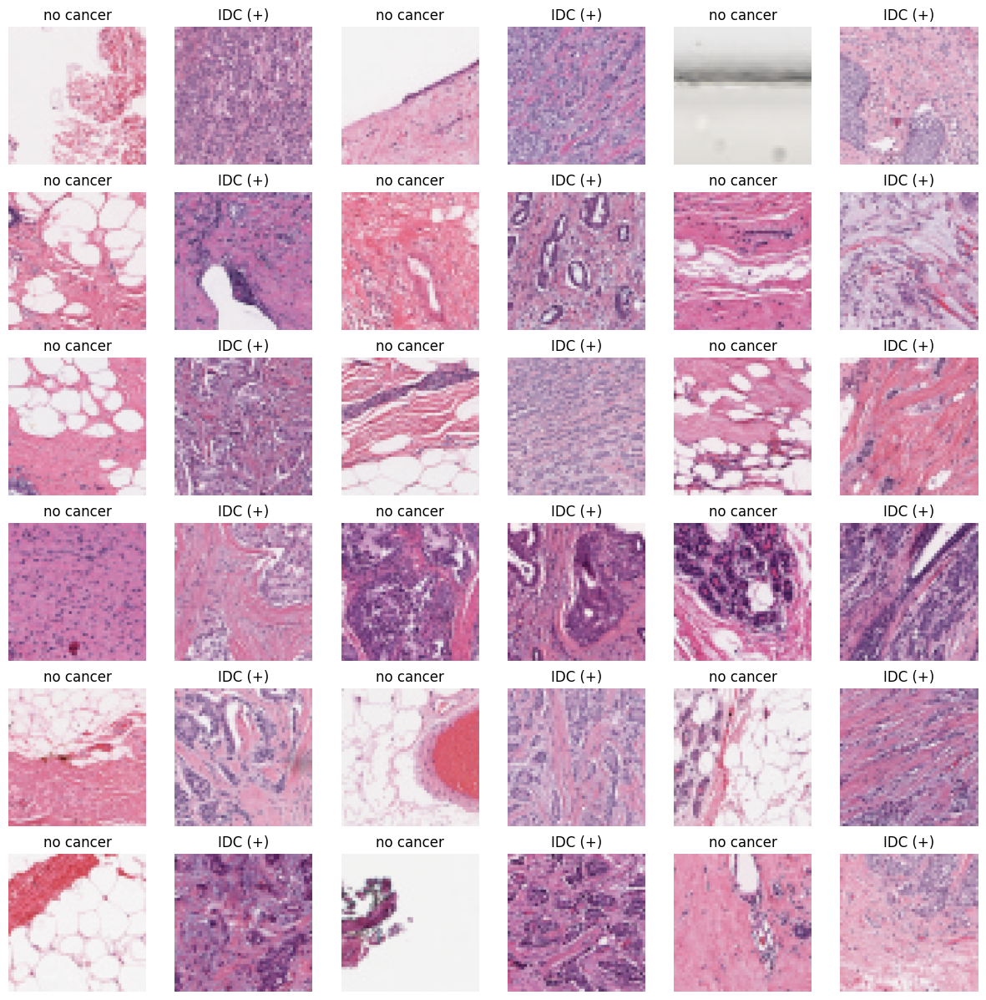

In [ ]:
N_IDC = []
P_IDC = []

for img in breast_img:
    if img[-5] == '0' :
        N_IDC.append(img)

    elif img[-5] == '1' :
        P_IDC.append(img)
plt.figure(figsize = (15, 15))

some_non = np.random.randint(0, len(N_IDC), 18)
some_can = np.random.randint(0, len(P_IDC), 18)

s = 0
for num in some_non:

        img = image.load_img((N_IDC[num]), target_size=(100, 100))
        img = image.img_to_array(img)

        plt.subplot(6, 6, 2*s+1)
        plt.axis('off')
        plt.title('no cancer')
        plt.imshow(img.astype('uint8'))
        s += 1
s = 1
for num in some_can:

        img = image.load_img((P_IDC[num]), target_size=(100, 100))
        img = image.img_to_array(img)

        plt.subplot(6, 6, 2*s)
        plt.axis('off')
        plt.title('IDC (+)')
        plt.imshow(img.astype('uint8'))
        s += 1

## **Applied Segmentation on Cancer Class Images**

Performing segmentation without the help of trained model



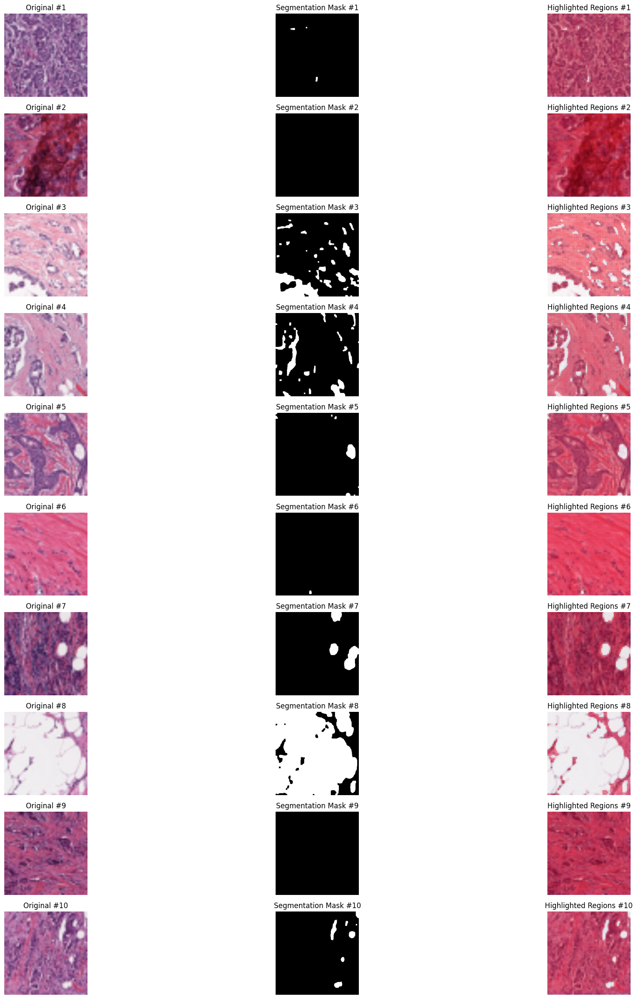

Image #1 - Percentage of area identified as potential IDC: 99.74%
Image #2 - Percentage of area identified as potential IDC: 100.00%
Image #3 - Percentage of area identified as potential IDC: 83.96%


In [ ]:


def segment_cancer_regions(image_path, threshold=0.6):
    """
    Segment potential cancer regions using image processing techniques
    Args:
        image_path: Path to the image
        threshold: Threshold for segmentation (0-1)
    Returns:
        original_img: Original image
        segmented_mask: Binary mask of segmented regions
        highlighted_img: Original image with highlighted regions
    """
    # Read image and resize to larger size
    original_img = cv2.imread(image_path)
    original_img = cv2.resize(original_img, (300, 300))  # Increased from 200x200

    # Convert to RGB for display
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    # Convert to HSV for better color segmentation
    hsv = cv2.cvtColor(original_img, cv2.COLOR_RGB2HSV)

    # Define white color range in HSV
    lower_white = np.array([0, 0, 200])
    upper_white = np.array([180, 30, 255])

    # Create mask for non-white regions (colored areas)
    white_mask = cv2.inRange(hsv, lower_white, upper_white)
    color_mask = cv2.bitwise_not(white_mask)  # Invert to get colored regions

    # Clean up the mask
    kernel = np.ones((3,3), np.uint8)
    color_mask = cv2.morphologyEx(color_mask, cv2.MORPH_OPEN, kernel, iterations=2)
    color_mask = cv2.morphologyEx(color_mask, cv2.MORPH_CLOSE, kernel, iterations=2)

    # Create segmentation mask (black for colored areas, white for white spaces)
    segmented_mask = np.ones_like(color_mask) * 255  # Start with all white
    segmented_mask[color_mask == 255] = 0  # Set colored areas to black

    # Create highlighted image with dots
    highlighted_img = original_img.copy()

    # Create dot pattern
    dot_pattern = np.zeros_like(color_mask)
    for i in range(0, color_mask.shape[0], 4):  # Adjust spacing by changing the step
        for j in range(0, color_mask.shape[1], 4):
            if color_mask[i, j] == 255:
                cv2.circle(dot_pattern, (j, i), 1, 255, -1)

    # Apply dots to highlighted image
    highlighted_img[dot_pattern == 255] = [255, 0, 0]  # Red dots

    return original_img, segmented_mask, highlighted_img

# Create visualization for 10 random positive IDC images
plt.figure(figsize=(24, 30))  # Increased figure size
random_samples = np.random.choice(P_IDC, 10, replace=False)

for idx, img_path in enumerate(random_samples):
    # Get segmented images
    original, mask, highlighted = segment_cancer_regions(img_path)

    # Plot original image
    plt.subplot(10, 3, 3*idx + 1)
    plt.title(f'Original #{idx+1}')
    plt.imshow(original)
    plt.axis('off')

    # Plot segmentation mask
    plt.subplot(10, 3, 3*idx + 2)
    plt.title(f'Segmentation Mask #{idx+1}')
    plt.imshow(mask, cmap='gray')
    plt.axis('off')

    # Plot highlighted regions
    plt.subplot(10, 3, 3*idx + 3)
    plt.title(f'Highlighted Regions #{idx+1}')
    plt.imshow(highlighted)
    plt.axis('off')

# Adjust layout with minimal spacing
plt.subplots_adjust(wspace=0.1, hspace=0.2)  # Reduced spacing between subplots
plt.show()

# Print some statistics about the segmentation
for idx, img_path in enumerate(random_samples[:3]):  # Show stats for first 3 images
    _, mask, _ = segment_cancer_regions(img_path)
    coverage = (mask == 0).sum() / (mask.shape[0] * mask.shape[1]) * 100
    print(f"Image #{idx+1} - Percentage of area identified as potential IDC: {coverage:.2f}%")

Using only 5000 images in each due lack resources (both class are equal)

In [ ]:
NewN_IDC=N_IDC[:5000]
NewP_IDC=P_IDC[:5000]
print(len(NewN_IDC))
print(len(NewP_IDC))

5000
5000


In [ ]:
non_img_arr = []
can_img_arr = []

for img in NewN_IDC:

    n_img = cv2.imread(img, cv2.IMREAD_COLOR)
    n_img_size = cv2.resize(n_img, (50, 50), interpolation = cv2.INTER_LINEAR)
    non_img_arr.append([n_img_size, 0])

for img in NewP_IDC:
    c_img = cv2.imread(img, cv2.IMREAD_COLOR)
    c_img_size = cv2.resize(c_img, (50, 50), interpolation = cv2.INTER_LINEAR)
    can_img_arr.append([c_img_size, 1])

In [ ]:
print(len(non_img_arr))
print(len(can_img_arr))
print(len(non_img_arr)+len(can_img_arr))

5000
5000
10000


Seperating images features and labels in differnt variable

In [ ]:
X = []
y = []

# breast_img_arr = np.concatenate((non_img_arr[:12389], can_img_arr[:12389]))
# Extend the lists instead of using concatenate
breast_img_arr = non_img_arr + can_img_arr
random.shuffle(breast_img_arr)

for feature, label in breast_img_arr:
    X.append(feature)
    y.append(label)

X = np.array(X)
y = np.array(y)

In [ ]:
def describeData(a,b):
    print('Total number of images: {}'.format(len(a)))
    print('Number of IDC(-) Images: {}'.format(np.sum(b==0)))
    print('Number of IDC(+) Images: {}'.format(np.sum(b==1)))
    print('Image shape (Width, Height, Channels): {}'.format(a[0].shape))
describeData(X,y)

Total number of images: 10000
Number of IDC(-) Images: 5000
Number of IDC(+) Images: 5000
Image shape (Width, Height, Channels): (50, 50, 3)


## **Spliting Dataset into Training, Validation and Testing Set**

In [ ]:
import sklearn
from sklearn.model_selection import train_test_split

# set aside 20% of train and test data for evaluation
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,
    test_size=0.2, random_state = 7)

# Use the same function above for the validation set
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, stratify=y_train,
    test_size=0.25, random_state= 7) # 0.25 x 0.8 = 0.2

print("X_train shape: {}".format(X_train.shape))
print("X_test shape: {}".format(X_test.shape))
print("y_train shape: {}".format(y_train.shape))
print("y_test shape: {}".format(y_test.shape))
print("X_val shape: {}".format(y_train.shape))
print("y_val shape: {}".format(y_test.shape))

X_train shape: (6000, 50, 50, 3)
X_test shape: (2000, 50, 50, 3)
y_train shape: (6000,)
y_test shape: (2000,)
X_val shape: (6000,)
y_val shape: (2000,)


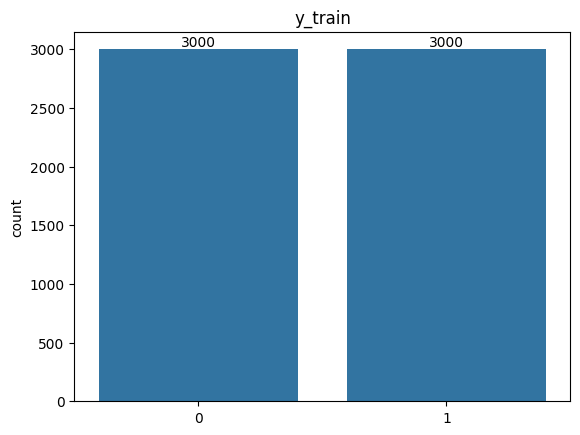

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# bar plot for y_train using sns
unique_values, value_counts = np.unique(y_train, return_counts=True)
ax = sns.countplot(x=y_train) # Pass the y_train array directly
ax.bar_label(ax.containers[0]) # Add labels to the bars
plt.title('y_train')
plt.show()

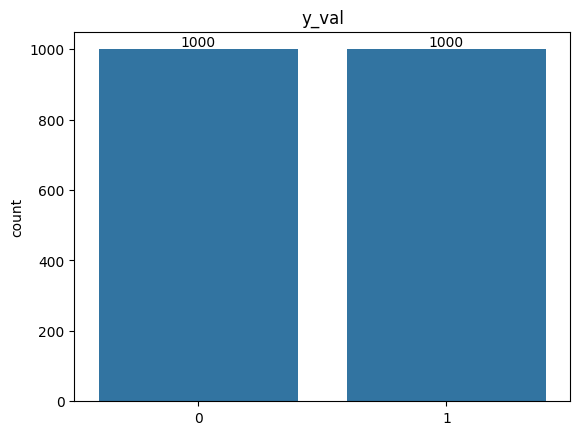

In [ ]:
# bar plot for  y_val using sns
unique_values, value_counts = np.unique(y_val, return_counts=True)
ax = sns.countplot(x=y_val) # Pass the y_val array directly
ax.bar_label(ax.containers[0]) # Add labels to the bars
plt.title('y_val')
plt.show()

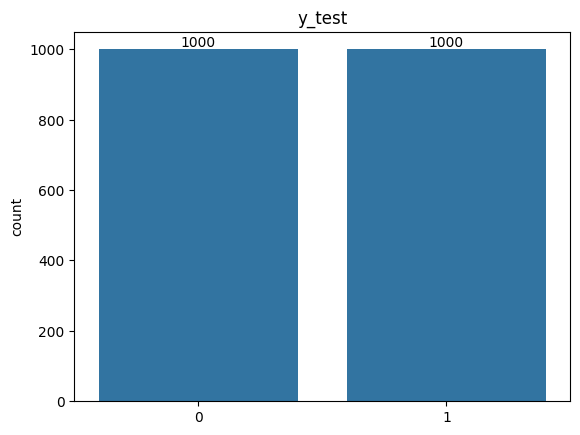

In [ ]:
# bar plot for y_test using sns
unique_values, value_counts = np.unique(y_test, return_counts=True)
ax = sns.countplot(x=y_test) # Pass the y_test array directly
ax.bar_label(ax.containers[0]) # Add labels to the bars
plt.title('y_test')
plt.show()

### ResNet50 Model

In [ ]:
from tensorflow.keras.applications.resnet import preprocess_input#ResNet50
# Define the normalization and standardization function
def preprocess(image, label):
    # Apply preprocessing specific to ResNet models
    image = preprocess_input(image)
    #image = tf.cast(image/255. ,tf.float32)#For CNN
    return image, label


X_train, y_train = preprocess(X_train, y_train)
X_val, y_val = preprocess(X_val, y_val)
X_test, y_test = preprocess(X_test, y_test)


In [ ]:
# pretrained_model = tf.keras.applications.DenseNet121(input_shape=(256, 256, 3), include_top=False, weights='imagenet')
pretrained_model = tf.keras.applications.ResNet50(input_shape=(50, 50, 3), include_top=False, weights='imagenet', pooling='avg')
pretrained_model.trainable=False
pretrained_model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 50, 50, 3)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 56, 56, 3)      │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 25, 25, 64)     │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 25, 25, 64)     │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 25, 25, 64)     │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 27, 27, 64)     │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 13, 13, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 13, 13, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 13, 13, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 13, 13, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 13, 13, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 13, 13, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 13, 13, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 13, 13, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 13, 13, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,587,712 (89.98 MB)

Using augmentation technique as a layer

In [ ]:
input_layer = tf.keras.layers.Input(shape=(50, 50, 3))
# pretrained_model = tf.keras.applications.MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')(input_layer)
# pretrained_model.trainable = False
#pretrained_model.summary
# for layer in pretrained_model.layers:
#     layer.trainable = False
# Define the data augmentation layer here, inside the model definition.
data_augmentation_layer = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
  tf.keras.layers.RandomZoom(0.2),
  # tf.keras.layers.RandomWidth(0.2),
  # tf.keras.layers.RandomHeight(0.2),
  tf.keras.layers.RandomContrast(0.2)
], name='data_augmentation')

da = data_augmentation_layer(input_layer)

x = pretrained_model(da, training=False)

bl = tf.keras.layers.BatchNormalization()(x)

#x = tf.keras.layers.MaxPooling2D()(x)
flat = tf.keras.layers.Flatten()(bl)

drop = tf.keras.layers.Dropout(0.5)(flat)

dense = tf.keras.layers.Dense(512, activation='relu')(drop)
drop = tf.keras.layers.Dropout(0.5)(dense)
batch = tf.keras.layers.BatchNormalization()(drop)

dense = tf.keras.layers.Dense(32, activation='relu')(batch)
batch = tf.keras.layers.BatchNormalization()(dense)
output_layer = tf.keras.layers.Dense(1, activation='sigmoid')(batch)

model_resnet50 = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

model_resnet50.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 50, 50, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, 50, 50, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50 (Functional)                │ (None, 2048)                │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 2048)                │           8,192 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │          16,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,663,617 (94.08 MB)

 Trainable params: 1,070,721 (4.08 MB)

 Non-trainable params: 23,592,896 (90.00 MB)

In [ ]:
model_resnet50.compile(optimizer = 'adam', loss='binary_crossentropy', metrics=['accuracy'])
model_resnet50.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 50, 50, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, 50, 50, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50 (Functional)                │ (None, 2048)                │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 2048)                │           8,192 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │          16,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,663,617 (94.08 MB)

 Trainable params: 1,070,721 (4.08 MB)

 Non-trainable params: 23,592,896 (90.00 MB)

In [ ]:
history = model_resnet50.fit(
    X_train,  # Pass only the image data as input
    y_train,  # Pass labels separately,
    #steps_per_epoch=steps_per_epoch,
    batch_size=32,
    epochs=50,
    validation_data=(X_val, y_val),  # Pass validation data as a tuple
    #validation_steps=val_steps_per_epoch,
    # callbacks=[check_point_model, early_stopping_model]
    #verbose=1
)


Epoch 1/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - accuracy: 0.7506 - loss: 0.5456 - val_accuracy: 0.8210 - val_loss: 0.4353
Epoch 2/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - accuracy: 0.8282 - loss: 0.4078 - val_accuracy: 0.8285 - val_loss: 0.3973
Epoch 3/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.8372 - loss: 0.3855 - val_accuracy: 0.8340 - val_loss: 0.4012
Epoch 4/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.8392 - loss: 0.3713 - val_accuracy: 0.8385 - val_loss: 0.3949
Epoch 5/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - accuracy: 0.8536 - loss: 0.3572 - val_accuracy: 0.8430 - val_loss: 0.3982
Epoch 6/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.8393 - loss: 0.3634 - val_accuracy: 0.8530 - val_loss: 0.3691
Epoch 7/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.8505 - loss: 0.3594 - val_accuracy: 0.8235 - val_loss: 0.4330
Epoch 8/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.8484 - loss: 0.3634 - val_ac

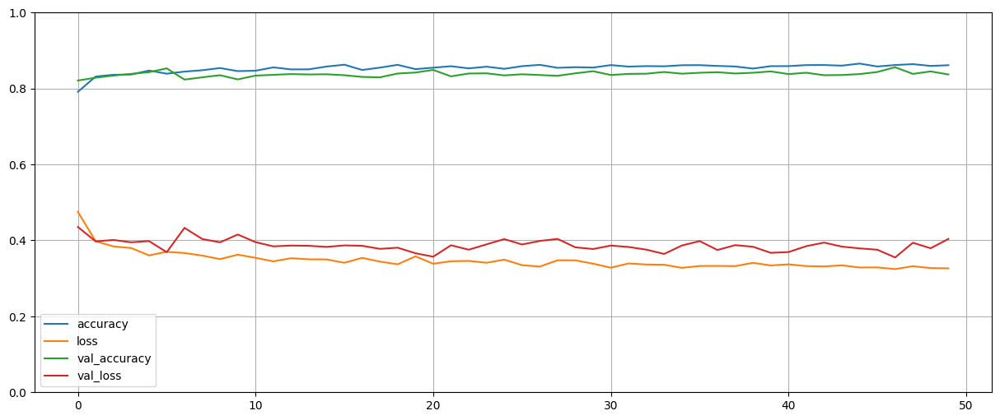

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
pd.DataFrame(history.history).plot(figsize=(15, 6))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

In [ ]:
model_resnet50.evaluate(X_test, y_test)


63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8478 - loss: 0.3519


[0.3669261634349823, 0.8429999947547913]

In [ ]:
# y_prob = model_resnet50.predict(X_test, y_test)
# y_prob

In [ ]:
import numpy as np

# Predict labels for the test data
y_pred = []
y_true = []

# Ensure X_test and y_test are numpy arrays
X_test = np.array(X_test)
y_test = np.array(y_test)

In [ ]:
batch_pred = model_resnet50.predict(X_test, verbose=1)
y_pred.extend(batch_pred)
y_true.extend(y_test)

63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step


In [ ]:
import numpy as np

# Convert y_pred to a NumPy array
y_pred = np.array(y_pred)

# Reshape y_pred if it has an extra dimension
if y_pred.ndim > 1 and y_pred.shape[1] == 1:
    y_pred = y_pred.reshape(-1)

# Apply the comparison and assignment
y_pred[y_pred > 0.5] = 1
y_pred[y_pred < 0.5] = 0

In [ ]:
class_labels=['No Cancer', 'Cancer']
print(classification_report(y_true, y_pred, target_names=class_labels))

              precision    recall  f1-score   support

   No Cancer       0.89      0.78      0.83      1000
      Cancer       0.81      0.91      0.85      1000

    accuracy                           0.84      2000
   macro avg       0.85      0.84      0.84      2000
weighted avg       0.85      0.84      0.84      2000



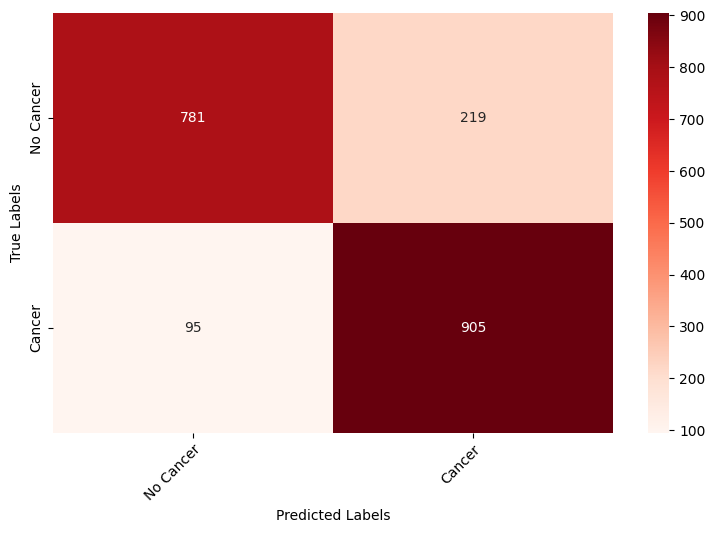

In [ ]:
import matplotlib.pyplot as plt
from sklearn import metrics
import seaborn as sns
# font = {
#     'size'   : 15}
# plt.rc('font', **font)
cm = metrics.confusion_matrix(y_true, y_pred)
fig, ax = plt.subplots(figsize=(10,6), dpi=100)
# Create colored confusion matrix with unique labels
labels = list(class_labels)
sns.heatmap(cm, annot=True, cmap='Reds', fmt='d', xticklabels=labels, yticklabels=labels)
 # Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
# Adjust the margins around the figure
plt.subplots_adjust(left=0.2, right=0.9, top=0.9, bottom=0.2)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
# fig.savefig('ResNet50_Independent_Testing.png')
plt.show()

Performing segmentation with help of trained model

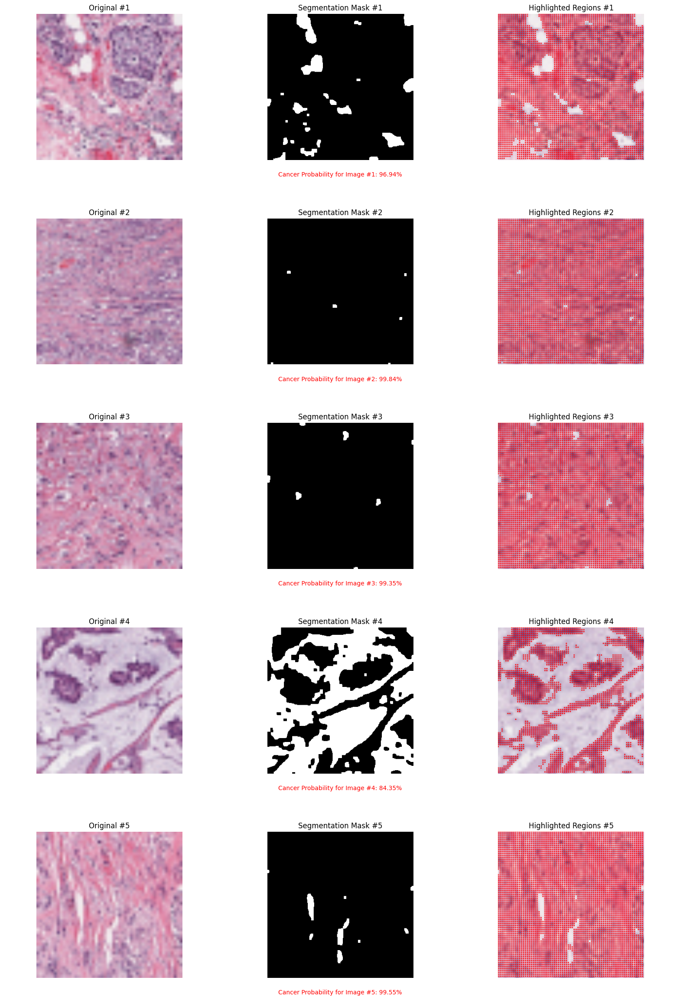

In [ ]:
from tensorflow.keras.applications.resnet import preprocess_input as resnet_preprocess_input
import numpy as np
import cv2
import matplotlib.pyplot as plt

def segment_cancer_regions(image_path, model, patch_size=50, stride=25, threshold=0.5):
    """
    Highlights potential cancer regions using the trained model by creating a heatmap
    Args:
        image_path: Path to the image
        model: Trained Keras model
        patch_size: Size of the patches to extract
        stride: Stride when extracting the patches
        threshold: Threshold for highlighting
    Returns:
        original_img: Original image
        segmented_mask: Binary mask of segmented regions
        highlighted_img: Original image with highlighted regions
        prediction: Cancer probability
    """
    # Read and preprocess the original image
    original_img = cv2.imread(image_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    # Resize to target size (50x50) as per model training
    target_size = (patch_size, patch_size)
    resized_img = cv2.resize(original_img, target_size)

    # Create a larger version for visualization
    display_size = (300, 300)
    display_img = cv2.resize(original_img, display_size)

    # Preprocess the image for model prediction
    processed_img = resized_img.astype('float32')
    processed_img = resnet_preprocess_input(processed_img)
    processed_img = np.expand_dims(processed_img, axis=0)

    # Get model prediction
    prediction = model.predict(processed_img, verbose=0)[0][0]

    # Create probability mask based on prediction
    probability_mask = np.zeros(display_size, dtype=np.float32)
    if prediction > threshold:
        # Convert to HSV for better color detection
        hsv = cv2.cvtColor(display_img, cv2.COLOR_RGB2HSV)

        # Define white color range in HSV
        lower_white = np.array([0, 0, 200])
        upper_white = np.array([180, 30, 255])

        # Create mask for non-white regions (colored areas)
        white_mask = cv2.inRange(hsv, lower_white, upper_white)
        probability_mask = cv2.bitwise_not(white_mask)  # Invert to get colored regions

    # Clean up the mask using morphological operations
    kernel = np.ones((3,3), np.uint8)
    probability_mask = cv2.morphologyEx(probability_mask, cv2.MORPH_OPEN, kernel, iterations=2)
    probability_mask = cv2.morphologyEx(probability_mask, cv2.MORPH_CLOSE, kernel, iterations=2)

    # Create segmentation mask (black for colored areas, white for white spaces)
    segmented_mask = np.ones_like(probability_mask) * 255  # Start with all white
    segmented_mask[probability_mask == 255] = 0  # Set colored areas to black

    # Create highlighted image with dots
    highlighted_img = display_img.copy()
    dot_pattern = np.zeros_like(segmented_mask)

    # Only create dots if cancer is detected
    if prediction > threshold:
        for i in range(0, segmented_mask.shape[0], 4):
            for j in range(0, segmented_mask.shape[1], 4):
                if segmented_mask[i, j] == 0:  # Check for black areas (potential cancer)
                    cv2.circle(dot_pattern, (j, i), 1, 255, -1)

    # Apply dots to highlighted image
    highlighted_img[dot_pattern == 255] = [255, 0, 0]  # Red dots

    return display_img, segmented_mask, highlighted_img, prediction

# Create figure with proper spacing for text
fig = plt.figure(figsize=(20, 35))  # Increased height to accommodate text
test_samples = np.random.choice(P_IDC, 5, replace=False)

# Calculate the height of each row including text
row_height = 1.0 / 6  # 5 images + extra space for text

for idx, img_path in enumerate(test_samples):
    original, mask, highlighted, prob = segment_cancer_regions(img_path, model_resnet50)

    # Calculate the position for this row's subplots
    row_pos = idx * row_height

    # Plot original image
    plt.subplot2grid((6, 3), (idx, 0))
    plt.title(f'Original #{idx+1}')
    plt.imshow(original)
    plt.axis('off')

    # Plot segmentation mask
    plt.subplot2grid((6, 3), (idx, 1))
    plt.title(f'Segmentation Mask #{idx+1}')
    plt.imshow(mask, cmap='gray')
    plt.axis('off')

    # Plot highlighted regions
    plt.subplot2grid((6, 3), (idx, 2))
    plt.title(f'Highlighted Regions #{idx+1}')
    plt.imshow(highlighted)
    plt.axis('off')

    # Add text in its own subplot row
    text_ax = plt.subplot2grid((6, 3), (idx, 0), colspan=3)
    text_ax.text(0.5, -0.1, f'Cancer Probability for Image #{idx+1}: {prob:.2%}',
                 ha='center', va='center', transform=text_ax.transAxes,
                 fontsize=10, color='red')
    text_ax.axis('off')

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.1, hspace=0.4)
plt.show()

### VGG16 Model

In [ ]:
from tensorflow.keras.applications.vgg16 import preprocess_input #VGG16
# Define the normalization and standardization function
def preprocess(image, label):
    # Apply preprocessing specific to ResNet models
    image = preprocess_input(image)
    #image = tf.cast(image/255. ,tf.float32)#For CNN
    return image, label


X_train, y_train = preprocess(X_train, y_train)
X_val, y_val = preprocess(X_val, y_val)
X_test, y_test = preprocess(X_test, y_test)


In [ ]:
# pretrained_model = tf.keras.applications.DenseNet121(input_shape=(256, 256, 3), include_top=False, weights='imagenet')
pretrained_model = tf.keras.applications.VGG16(input_shape=(50, 50, 3), include_top=False, weights='imagenet', pooling='avg')
pretrained_model.trainable=False
pretrained_model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 50, 50, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 50, 50, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 50, 50, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 25, 25, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 25, 25, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 25, 25, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 12, 12, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 12, 12, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 12, 12, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 12, 12, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 6, 6, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 6, 6, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 6, 6, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 6, 6, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 3, 3, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 3, 3, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 3, 3, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 3, 3, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 1, 1, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

Using augmentation technique as a layer

In [ ]:
input_layer = tf.keras.layers.Input(shape=(50, 50, 3))
# pretrained_model = tf.keras.applications.MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')(input_layer)
# pretrained_model.trainable = False
#pretrained_model.summary
# for layer in pretrained_model.layers:
#     layer.trainable = False
# Define the data augmentation layer here, inside the model definition.
data_augmentation_layer = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
  tf.keras.layers.RandomZoom(0.2),
  # tf.keras.layers.RandomWidth(0.2),
  # tf.keras.layers.RandomHeight(0.2),
  tf.keras.layers.RandomContrast(0.2)
], name='data_augmentation')

da = data_augmentation_layer(input_layer)

x = pretrained_model(da, training=False)


bl = tf.keras.layers.BatchNormalization()(x)

#x = tf.keras.layers.MaxPooling2D()(x)
flat = tf.keras.layers.Flatten()(bl)

drop = tf.keras.layers.Dropout(0.5)(flat)

dense = tf.keras.layers.Dense(512, activation='relu')(drop)
drop = tf.keras.layers.Dropout(0.5)(dense)
batch = tf.keras.layers.BatchNormalization()(drop)

dense = tf.keras.layers.Dense(32, activation='relu')(batch)
batch = tf.keras.layers.BatchNormalization()(dense)
output_layer = tf.keras.layers.Dense(1, activation='sigmoid')(batch)

model_vgg16 = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

model_vgg16.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 50, 50, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, 50, 50, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 512)                 │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │          16,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,998,017 (57.21 MB)

 Trainable params: 281,217 (1.07 MB)

 Non-trainable params: 14,716,800 (56.14 MB)

In [ ]:
model_vgg16.compile(optimizer = 'adam', loss='binary_crossentropy', metrics=['accuracy'])
model_vgg16.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 50, 50, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, 50, 50, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 512)                 │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │          16,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,998,017 (57.21 MB)

 Trainable params: 281,217 (1.07 MB)

 Non-trainable params: 14,716,800 (56.14 MB)

In [ ]:
history = model_vgg16.fit(
    X_train,  # Pass only the image data as input
    y_train,  # Pass labels separately,
    #steps_per_epoch=steps_per_epoch,
    batch_size=32,
    epochs=50,
    validation_data=(X_val, y_val),  # Pass validation data as a tuple
    #validation_steps=val_steps_per_epoch,
    # callbacks=[check_point_model, early_stopping_model]
    #verbose=1
)


Epoch 1/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - accuracy: 0.7217 - loss: 0.5692 - val_accuracy: 0.8110 - val_loss: 0.5227
Epoch 2/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - accuracy: 0.7889 - loss: 0.4866 - val_accuracy: 0.8045 - val_loss: 0.4716
Epoch 3/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - accuracy: 0.7869 - loss: 0.4490 - val_accuracy: 0.8170 - val_loss: 0.4572
Epoch 4/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.7994 - loss: 0.4511 - val_accuracy: 0.8175 - val_loss: 0.4368
Epoch 5/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.8074 - loss: 0.4414 - val_accuracy: 0.8205 - val_loss: 0.4479
Epoch 6/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.8018 - loss: 0.4489 - val_accuracy: 0.8140 - val_loss: 0.4355
Epoch 7/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.8087 - loss: 0.4205 - val_accuracy: 0.8165 - val_loss: 0.4329
Epoch 8/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.8139 - loss: 0.4316 - val_ac

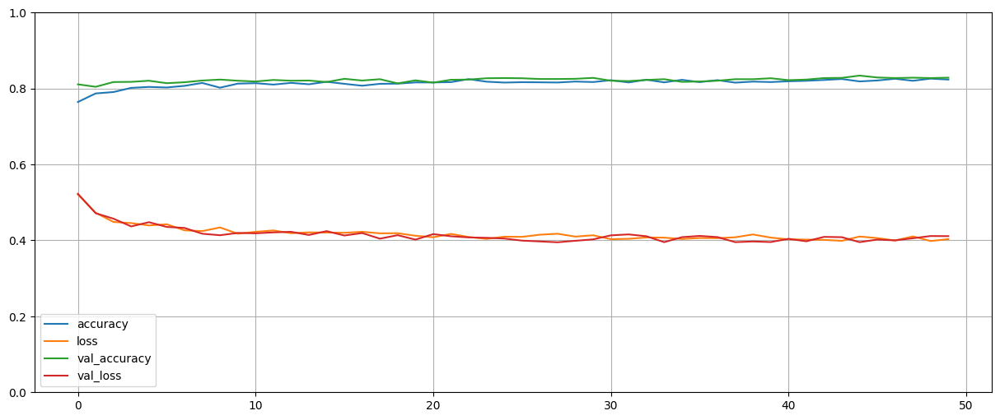

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
pd.DataFrame(history.history).plot(figsize=(15, 6))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

In [ ]:
model_vgg16.evaluate(X_test, y_test)


63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.8284 - loss: 0.3958


[0.3839273452758789, 0.8314999938011169]

In [ ]:
# y_prob = model_vgg16.predict(X_test, y_test)
# y_prob

In [ ]:
import numpy as np

# Predict labels for the test data
y_pred = []
y_true = []

# Ensure X_test and y_test are numpy arrays
X_test = np.array(X_test)
y_test = np.array(y_test)

In [ ]:
batch_pred = model_vgg16.predict(X_test, verbose=1)
y_pred.extend(batch_pred)
y_true.extend(y_test)

63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step


In [ ]:
import numpy as np

# Convert y_pred to a NumPy array
y_pred = np.array(y_pred)

# Reshape y_pred if it has an extra dimension
if y_pred.ndim > 1 and y_pred.shape[1] == 1:
    y_pred = y_pred.reshape(-1)

# Apply the comparison and assignment
y_pred[y_pred > 0.5] = 1
y_pred[y_pred < 0.5] = 0

In [ ]:
class_labels=['No Cancer', 'Cancer']
print(classification_report(y_true, y_pred, target_names=class_labels))

              precision    recall  f1-score   support

   No Cancer       0.87      0.78      0.82      1000
      Cancer       0.80      0.88      0.84      1000

    accuracy                           0.83      2000
   macro avg       0.84      0.83      0.83      2000
weighted avg       0.84      0.83      0.83      2000



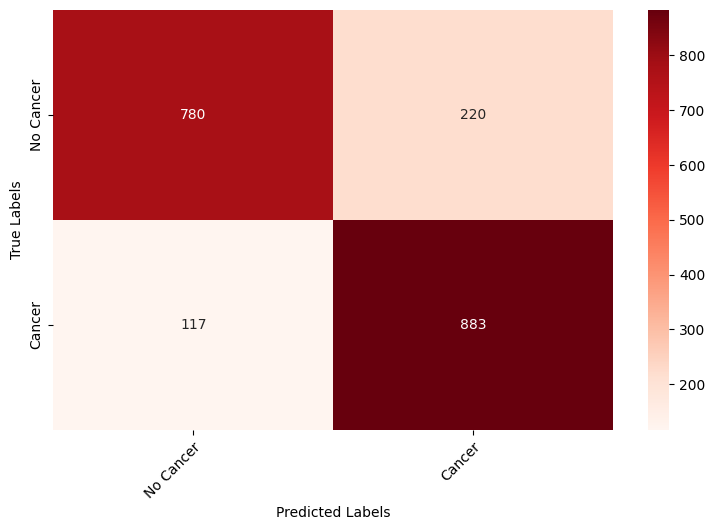

In [ ]:
import matplotlib.pyplot as plt
from sklearn import metrics
import seaborn as sns
# font = {
#     'size'   : 15}
# plt.rc('font', **font)
cm = metrics.confusion_matrix(y_true, y_pred)
fig, ax = plt.subplots(figsize=(10,6), dpi=100)
# Create colored confusion matrix with unique labels
labels = list(class_labels)
sns.heatmap(cm, annot=True, cmap='Reds', fmt='d', xticklabels=labels, yticklabels=labels)
 # Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
# Adjust the margins around the figure
plt.subplots_adjust(left=0.2, right=0.9, top=0.9, bottom=0.2)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
# fig.savefig('DenseNet121_Independent_Testing.png')
plt.show()

Performing segmentation with help of trained model

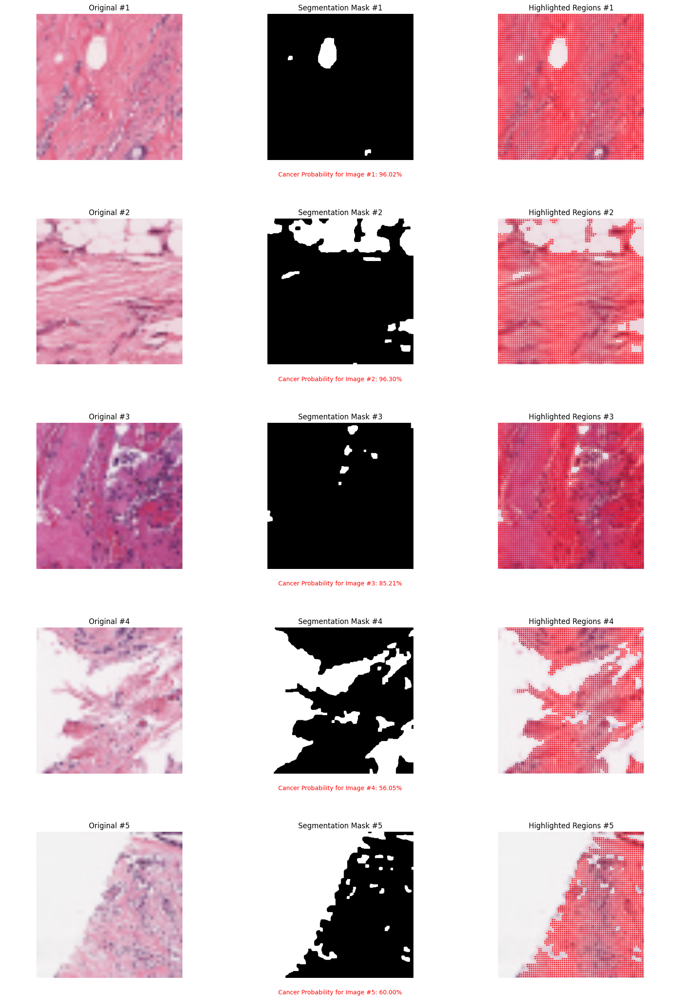

In [ ]:
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg_preprocess_input
import numpy as np
import cv2
import matplotlib.pyplot as plt

def segment_cancer_regions(image_path, model, patch_size=50, stride=25, threshold=0.5):
    """
    Highlights potential cancer regions using the trained model by creating a heatmap
    Args:
        image_path: Path to the image
        model: Trained Keras model
        patch_size: Size of the patches to extract
        stride: Stride when extracting the patches
        threshold: Threshold for highlighting
    Returns:
        original_img: Original image
        segmented_mask: Binary mask of segmented regions
        highlighted_img: Original image with highlighted regions
        prediction: Cancer probability
    """
    # Read and preprocess the original image
    original_img = cv2.imread(image_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    # Resize to target size (50x50) as per model training
    target_size = (patch_size, patch_size)
    resized_img = cv2.resize(original_img, target_size)

    # Create a larger version for visualization
    display_size = (300, 300)
    display_img = cv2.resize(original_img, display_size)

    # Preprocess the image for model prediction
    processed_img = resized_img.astype('float32')
    processed_img = vgg_preprocess_input(processed_img)
    processed_img = np.expand_dims(processed_img, axis=0)

    # Get model prediction
    prediction = model.predict(processed_img, verbose=0)[0][0]

    # Create probability mask based on prediction
    probability_mask = np.zeros(display_size, dtype=np.float32)
    if prediction > threshold:
        # Convert to HSV for better color detection
        hsv = cv2.cvtColor(display_img, cv2.COLOR_RGB2HSV)

        # Define white color range in HSV
        lower_white = np.array([0, 0, 200])
        upper_white = np.array([180, 30, 255])

        # Create mask for non-white regions (colored areas)
        white_mask = cv2.inRange(hsv, lower_white, upper_white)
        probability_mask = cv2.bitwise_not(white_mask)  # Invert to get colored regions

    # Clean up the mask using morphological operations
    kernel = np.ones((3,3), np.uint8)
    probability_mask = cv2.morphologyEx(probability_mask, cv2.MORPH_OPEN, kernel, iterations=2)
    probability_mask = cv2.morphologyEx(probability_mask, cv2.MORPH_CLOSE, kernel, iterations=2)

    # Create segmentation mask (black for colored areas, white for white spaces)
    segmented_mask = np.ones_like(probability_mask) * 255  # Start with all white
    segmented_mask[probability_mask == 255] = 0  # Set colored areas to black

    # Create highlighted image with dots
    highlighted_img = display_img.copy()
    dot_pattern = np.zeros_like(segmented_mask)

    # Only create dots if cancer is detected
    if prediction > threshold:
        for i in range(0, segmented_mask.shape[0], 4):
            for j in range(0, segmented_mask.shape[1], 4):
                if segmented_mask[i, j] == 0:  # Check for black areas (potential cancer)
                    cv2.circle(dot_pattern, (j, i), 1, 255, -1)

    # Apply dots to highlighted image
    highlighted_img[dot_pattern == 255] = [255, 0, 0]  # Red dots

    return display_img, segmented_mask, highlighted_img, prediction

# Create figure with proper spacing for text
fig = plt.figure(figsize=(20, 35))  # Increased height to accommodate text
test_samples = np.random.choice(P_IDC, 5, replace=False)

# Calculate the height of each row including text
row_height = 1.0 / 6  # 5 images + extra space for text

for idx, img_path in enumerate(test_samples):
    original, mask, highlighted, prob = segment_cancer_regions(img_path, model_vgg16)

    # Calculate the position for this row's subplots
    row_pos = idx * row_height

    # Plot original image
    plt.subplot2grid((6, 3), (idx, 0))
    plt.title(f'Original #{idx+1}')
    plt.imshow(original)
    plt.axis('off')

    # Plot segmentation mask
    plt.subplot2grid((6, 3), (idx, 1))
    plt.title(f'Segmentation Mask #{idx+1}')
    plt.imshow(mask, cmap='gray')
    plt.axis('off')

    # Plot highlighted regions
    plt.subplot2grid((6, 3), (idx, 2))
    plt.title(f'Highlighted Regions #{idx+1}')
    plt.imshow(highlighted)
    plt.axis('off')

    # Add text in its own subplot row
    text_ax = plt.subplot2grid((6, 3), (idx, 0), colspan=3)
    text_ax.text(0.5, -0.1, f'Cancer Probability for Image #{idx+1}: {prob:.2%}',
                 ha='center', va='center', transform=text_ax.transAxes,
                 fontsize=10, color='red')
    text_ax.axis('off')

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.1, hspace=0.4)
plt.show()